<a href="https://colab.research.google.com/github/nlauchande/shuri/blob/master/final_report.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning Engineer Nanodegree
## Capstone Project 

### Santander Customer Transaction Prediction - Can you identify who will make a transaction?

Natu Lauchande
June 11, 2019

## I. Definition

### Project Overview

Financial services are at the cornerstone of the modern society opportunity value chain for indivuals and business. Santander is a bank that thrives to know their customers better to serve them correctly. Part of providing the customers with the right financial choices is to be able to know and predict their desires [1] .

The topic of this project is to predict if bank customers will make a specific transaction in the future based on a set of anonymous features. Predicting customer propensity/suitability for transaction or willigness is paramount on bringing inclusion and low cost financial services for underprivilliged communities [6] . 

Predicting if a customer for instance will make a specific transaction might help the financial institution provision resources if it makes business sense  . A special important application of predicting transaction is in the context of financial fraud . Having a performant transaction fraud detection system can lower financial risk for institutions [7].

Being able to predict what transaction is more likely a banking user would make can also enable more ways to connect with customers: using appropriate digital channels, for example SMS and mobile, apps enables engagement with customers who have previously been unreachable by and therefore invisible to more traditional environments.

The fact that the current project focus on anonymized data( no identification of the variable names and basically numerical data) opens the possibility of using the outcomes of this project in diverse contexts aligned with data privacy. 


### Problem Statement

The problem statement of this project is based on the Kaggle competition  : 

The goal of this project is to solve the problem of predicting wether a customer will make a given unidentified transaction given a set of features and historical data . The core of the project is to identify which customers will make a specific transaction in the future, irrespective of the amount of money transacted [1]. 


The solution for this project will consistist of the following : 

1. An exploratory analysis of the training dataset provided by the Santander competion.
2. A predictive solution to the problem.
3. A notebook and reporting depicting the solution process to the problem.

### Metrics

A set of metrics will be used to optimize and choose between the different models: 

In terms of metrics to objectively compare the different models we decided to choose the 

The Area Under Curve (AUC) of the Receiver Operator characteristics is a comparison of how well a binary classifier distinguishes between the two classes at play in the specific problem.

- AUC ROC curve metric ( as suggested in the official competition) [2]


![alt text](https://cdn-images-1.medium.com/max/1600/1*pk05QGzoWhCgRiiFbz-oKQ.png)[7]

Important definitions :

$$ True Positive Rate (tpr) = {{Number of True Positives} \over {Number of True Positives + Number of False Negatives}}.$$

$$ False Positive Rate (tpr) = {{Number of False Positives} \over {Number of True Positives + Number of False Negatives}}.$$

The area under the curve is able to capture the quality measuring the quality of a scoring function. The best possible ROC curve has the are 1 the closer your ROC curve area is to 1 the better is the classifier. The maximum uncertainity classifier would yield an area of 0.5 and would be the diagonal line of the graph of the figure above [3]. 

Given that the current problem is a binary classifier the AUC ROC metric will allow us to compare correctly the quality of the different classifiers.




## II. Analysis

### Data Exploration



#### Loading libraries

In [43]:
!pip install catboost

from sklearn.metrics import accuracy_score, log_loss, confusion_matrix, precision_recall_fscore_support
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV 
from keras.wrappers.scikit_learn import KerasClassifier
from keras.models import Sequential
from keras.layers import Dense

from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split

import xgboost as xgb
from xgboost import XGBClassifier


import catboost as catboost
from catboost import CatBoostClassifier


# Import the modules

import pandas as pd
import numpy as np
import sklearn as sk

# Data Vis
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set(style='white', context='notebook', palette='deep') 
import matplotlib.style as style
style.use('fivethirtyeight')


#### Read the data

In [5]:
# Get the data
train = pd.read_csv('train.csv')

# Change the settings so that you can see all columns of the dataframe when calling df.head()
pd.set_option('display.max_columns',20)

# Get target
target = 'target'

# Get quantitative features and delete the unnccessary features
features = [f for f in train.columns if train.dtypes[f] != 'object']
features.remove('target')


train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


### Data types

In [0]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Columns: 202 entries, ID_code to var_199
dtypes: float64(200), int64(1), object(1)
memory usage: 308.2+ MB


### Missing data analysis

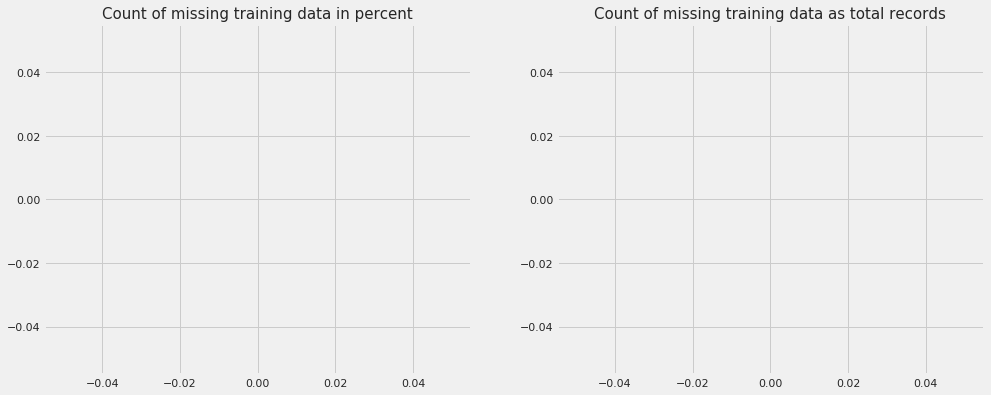

In [0]:
# Capture the necessary data
variables = train.columns

count = []

for variable in variables:
    length = train[variable].count()
    count.append(length)
    
count_pct = np.round(100 * pd.Series(count) / len(train), 2)
count = pd.Series(count)

missing = pd.DataFrame()
missing['variables'] = variables
missing['count'] = len(train) - count
missing['count_pct'] = 100 - count_pct
missing = missing[missing['count_pct'] > 0]
missing.sort_values(by=['count_pct'], inplace=True)
missing_train = np.array(missing['variables'])

#Plot number of available data per variable
plt.subplots(figsize=(15,6))

# Plots missing data in percentage
plt.subplot(1,2,1)
plt.barh(missing['variables'], missing['count_pct'])
plt.title('Count of missing training data in percent', fontsize=15)

# Plots total row number of missing data
plt.subplot(1,2,2)
plt.barh(missing['variables'], missing['count'])
plt.title('Count of missing training data as total records', fontsize=15)

plt.show()

The graph above displaying basically no missing data in the training dataset.  What is perhaps good news in terms of less work during data preparation to impute missing varables.

> ### Target description

This section describes the target variable and it's distribution . From the above data we clearly have a category imbalance problem in here. A ration of 1:9 between a target of taking a transaction and not taking a transaction. 

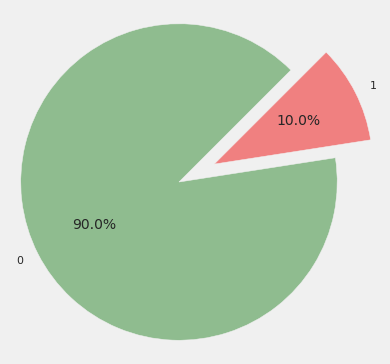

In [0]:
# distribution of targets
colors = ['darkseagreen','lightcoral']
plt.figure(figsize=(6,6))
plt.pie(train["target"].value_counts(), explode=(0, 0.25), labels= ["0", "1"], startangle=45, autopct='%1.1f%%', colors=colors)
plt.axis('equal')
plt.show()

### Features description

It can be seen form the table description below that some of the standard deviations below are very high . This dataset can definitely benefit from some normalization down the line. 

In [0]:
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


### Features Exploratory Visualization

This section aim is to give a visual glance of the dataset that we are handling in this project . Focusing on a visual tour of the features and it's inter relations. 


#### Feature Correlation Heatmaps

The correlation analysis helps us understanding how 2 variables are related . It's clear from the figure below that there is very little correlation between the variables in the dataset. 

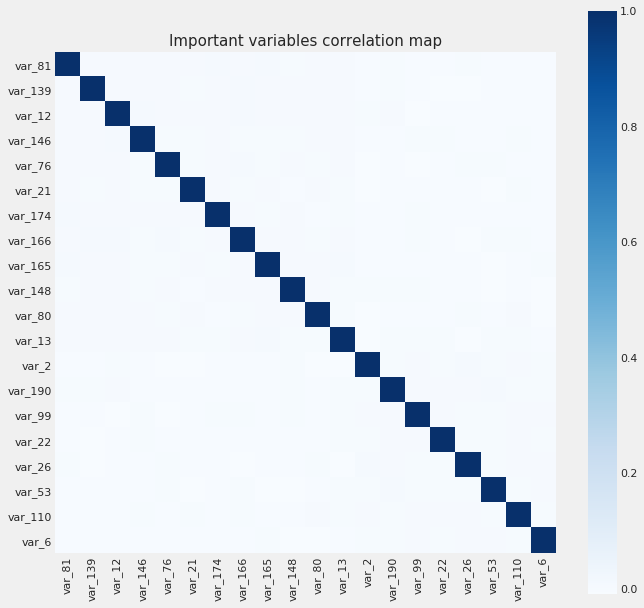

In [0]:
# correlation with target
# Code adapted from : https://www.kaggle.com/yuzusan/santander-draft-v3-eda-lgb-nn
from scipy.stats import spearmanr

labels = []
values = []

for col in train.columns:
    if col not in ['ID_code', 'target']:
        labels.append(col)
        values.append(spearmanr(train[col].values, train['target'].values)[0])

corr_df = pd.DataFrame({'col_labels': labels, 'corr_values' : values})
corr_df = corr_df.sort_values(by='corr_values')

corr_df = corr_df[(corr_df['corr_values']>0.03) | (corr_df['corr_values']<-0.03)]


# check covariance among importance variables
cols_to_use = corr_df[(corr_df['corr_values']>0.05) | (corr_df['corr_values']<-0.05)].col_labels.tolist()

temp_df = train[cols_to_use]
corrmat = temp_df.corr(method='spearman')
f, ax = plt.subplots(figsize=(10, 10))

#Draw the heatmap using seaborn
sns.heatmap(corrmat, vmax=1., square=True, cmap="Blues")
plt.title("Important variables correlation map", fontsize=15)
plt.show()

A correlation map above shows that the features are definitely not correlated so this particular problem won't win a lot from a dimensionality reduction pre-processing step.

#### Top 20 features distribution

In the benchmark section a simple logistic regression was run and benchmar and a feature importance list derived from there. A limited set of relevant features would allow us to have a look at differnet properties of the dataset.

In [0]:
top20_features = ["var_45","var_47","var_96","var_182","var_120","var_61","var_158","var_136","var_117","var_10","var_41","var_103","var_98","var_160",
"var_17","var_183","var_38","var_30"]

top20_features_target = top20_features+["target"]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd8400f1780>,
      dtype=object)

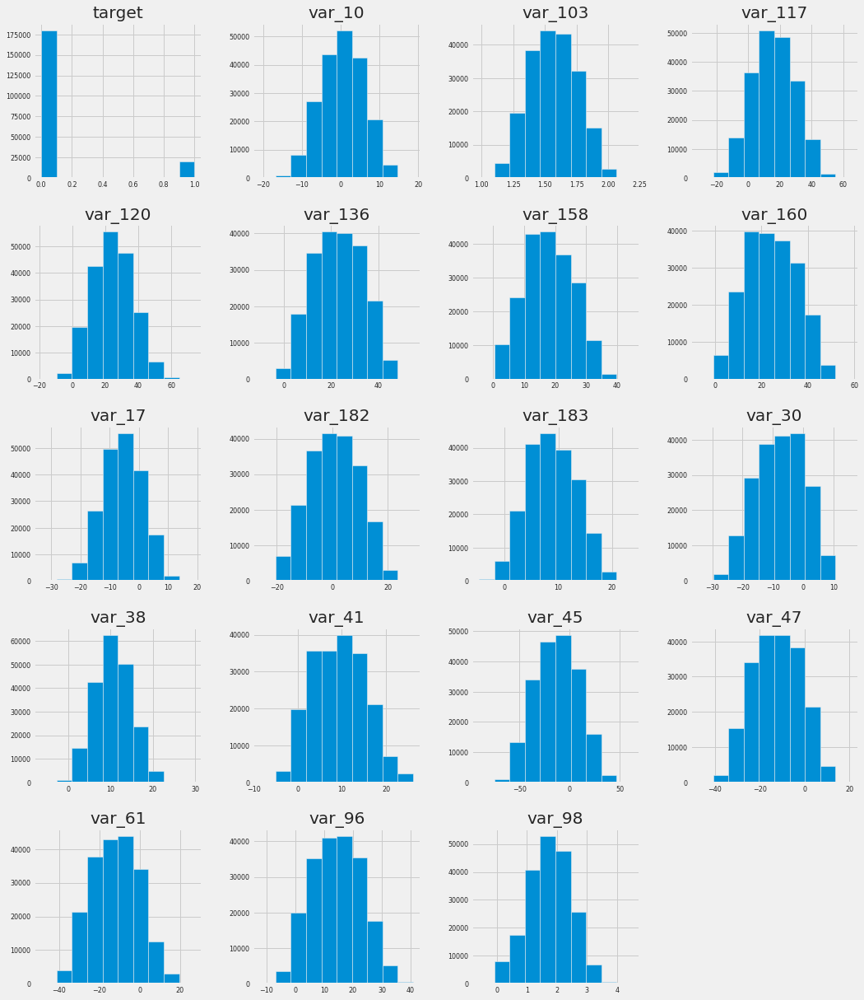

In [25]:
train[top20_features_target].hist(figsize=(16, 20), xlabelsize=8, ylabelsize=8)

On the distribution graph above becomes very clear an underlying normal distribution of the important variables this . The target imbalance is definitely super distinct from the top 20 most important features.  

Another important visualisation is the relation between the restricted set of relevant variables and the target pairwise :

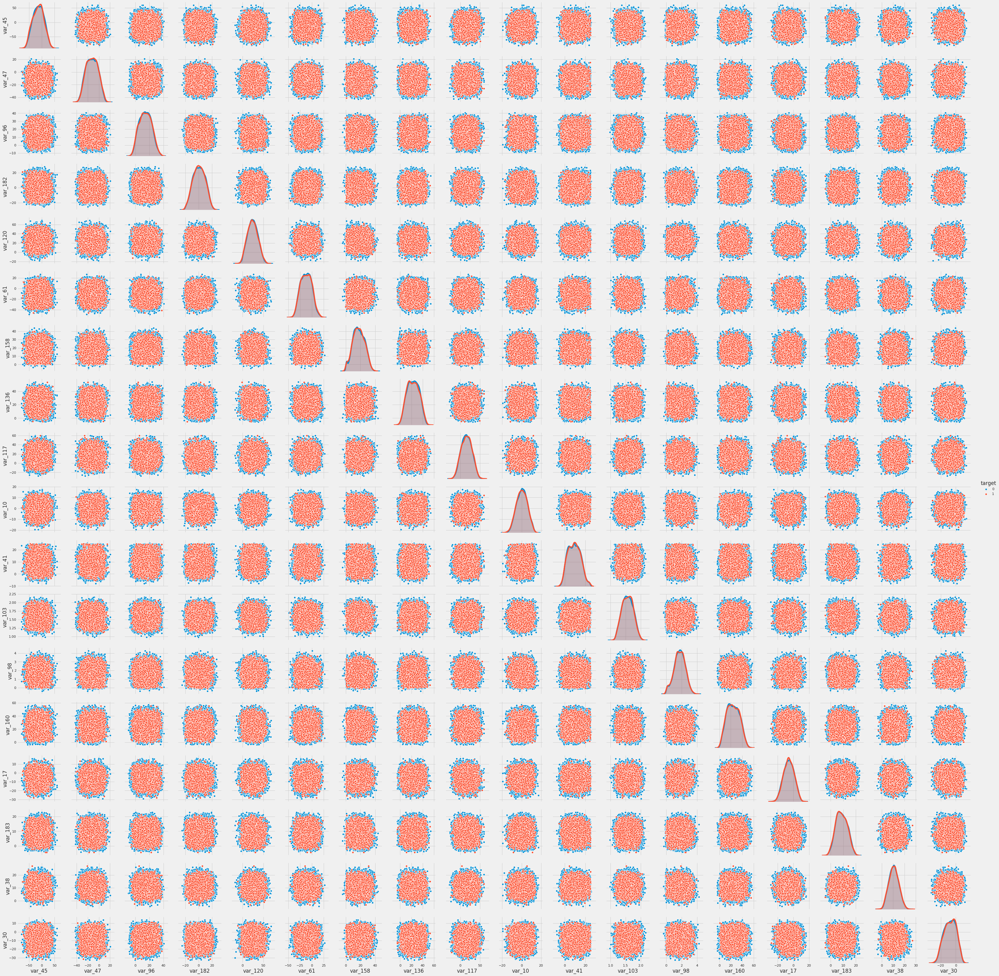

In [30]:


sns.pairplot(train[top20_features_target].sample(frac=0.2), vars=top20_features, hue="target")

No significant conclusion can be driven from the insights provided from the visualisations above. Definitely confirming the low correlation between the variables showing just the distributionn between binary target variable.

### Algorithms and Techniques


As noticed before the training dataset suffers from class imbalance that needs to be addressed during model iteration and taken into consideration by mitigating using the most appropriate strategies(example : Smote, sampling, penalties, etc.)[8].


The general approach on solving the problem of this project is the following :

1. Apply standard data pre-processing :
         * Data standarization
         * Data normalization scaling
         * Category imbalance mitigation
         * Feature selection based on importance ranking

2. Run a baseline classifier pipeline on each stage of the data processing to detect improvements. Having a pipeline of classifiers ready to use facilitates the execution of the process and to denote improvements from  the different standard techniques.

3.Select from step 2 the most promising classifier and execute further tuning.

The classifier pipeline consists of the following algorithms :

#### Logistic Regression

Logistic regression is one of the most classifical machine learning algorithms. It's a regression technique that instead of using a linear function to fit the training point it use a sigmoid function.[3]

Among main strenghts of the logistic regression are the following :
* Interpretability ( the sklearn implementation provides feature importance that can be used for feature selection)
* Fast to run
* Natural fit for binary classification problems


#### Naive Bayes
Naive bayes is a simple probabilistic classifier. In it's simplistic form is an implementation of the Bayes Theorem with the featureset with the "naive" assumption that features are not correlated. It's very common as a baseline for text classification problems. [10]

The main motive behind the choice for this particular problem is the fact that it's extremely fast and the low correlation on the feature set detected during Data Exploration.


#### Tree ensemple techniques

Ensemble techniques are based on a combination of multiple weak learners that can be used for classification or regression . [11]

A common type of ensembles are the ones based on tree methods ( example : Gradient Boosting, Random Forests), presenting a combinations of trees that in particular are performant in one component of the target distribution . 

Ensemble techniques are a very popular approach to a lot of popular tabular/transactional data problems wiith significant success across industries.



##### Random Forest
The random forest algorithm basically uses the mode or mean  of the different trees identified by decision trees learned by random selections of the training data.


$\hat{f} = \frac{1}{B} \sum_{b=1}^Bf_b (x')$   [12]


The equation above represents the situation when we are averaging the data.


##### XGBoost
It's a  technique based on Gradient Boosting that combines weak classifiers in sequence where each classifier is created where the data of mispredictions in the training data is augmented.  The implementation is relatively fast and simple to use.  

##### Catboost
Catboost is a new generation of boosting frameworks that uses some new insights and has out of the optimization tuning and optimization.  [13].  

The main reason to choose this technique as one of the candidates for this project was to evaluate also the capabilities of this new framework.


#### Neural Networks

A classifical technique recently populalirized by the industry success of Deep Learning techniques for perception data ( audio, video, speech) and natural language problems. 


Defined as  collection of connected units or nodes called artificial neurons, each connection can transmit a signal from one artificial neuron to another. Each neuron receives a signal from an external source ( another neuron or input data) and is able to learns an expected classification in a supervised learning setting.  An artificial neuron mimics the working of a biophysical neuron with inputs and outputs. [3]


The two techniques described below ( Data Scaling, and Handling imbalanced datasets ) are basically data processing techniques executed to improve the performance of machine learning algorithms on the training data and will be applied after a given baseline .

### Data Scaling

Machine learning algorithms and  techniques generally assume out of the box the input being of standard normal distributed data. The scaling of data  facilitates  optimization techniques and improves learning on standardized data.  Sklearn provides a simple method that will be used in this project : StandardScaler [15]


### Handling imbalanced datasets

Given the fact that our initial dataset is highly unballanced some techniques must be used to improve the accuracy rate of the dataset.

Most of the inspiration on the techniques used in this project involved looking at the following project : https://www.kaggle.com/rafjaa/resampling-strategies-for-imbalanced-datasets 



### Cross Validation









### Benchmark

The benchmark for this classification is based on a simple out of the box Logistic Regression binary classification over the data implemented with the intention of improving the model with insights gained over the execution of the project.

Another possibility of a benchmark could be the Kaggle Competition Leaderboard in itself, after a careful evaluation of some of the submissions it became clear to me that most of the solutions on the Kaggle projects are based on deep expertise and specialized competition specfic knowledge ( stacking , over fitting and feature engineering). In line with broadening personal knowledge in Data Science and Machine Learnign there is a deliberate choice on this project for a simpler benchmark that will allow to improve on knowledge gained over the Nanodegree.

Benchmark model will  the out of the box vanilla logistic regression outlined below:

In [0]:


from sklearn.linear_model import LogisticRegression


X=train[features]
y=train[target]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
X_train.head()

clf = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial').fit(X_train, y_train)

y_pred = clf.predict(X_test)
y_probas = clf.predict_proba(X_test)





A standard 70/30 ratio was chosen to split between testing and training data. This split will and training data ratio is used throughout the execute the project. 

To calculate the benchmark metrics sklearn metric package  was used :

In [7]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test, y_pred)

0.6089108100381436

Basically the benchmark that we are looking forward to beat is an AUC that is better than 0.6089.

One extra advantage of the logistic regression approach is the ability to give a feature importance score that helps limiting the number of variables used during analytics or prediction. The features below will be used for further exploratory data analysis .

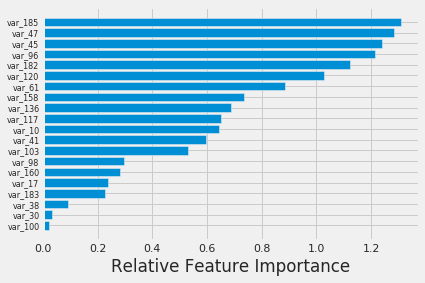

In [8]:
feature_importance = abs(clf.coef_[0])
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)[0:20]
pos = np.arange(sorted_idx.shape[0]) + .5

featfig = plt.figure()
featax = featfig.add_subplot(1, 1, 1)
featax.barh(pos, feature_importance[sorted_idx], align='center')
featax.set_yticks(pos)
featax.set_yticklabels(np.array(X.columns)[sorted_idx], fontsize=8)
featax.set_xlabel('Relative Feature Importance')



 
plt.show()

## III. Methodology

This section contains a more detailed description and execution documentation of the approach to tackle this particular problem . The summary of this approach is basically data pre-processing tuning followed by an algorithmic refined depicted by the training classifiers pipeline and the further refinement processes.

### Data Preprocessing

The main preprocessing techniques used in this project were data normalization and target data imbalance resolution through augmentation.









As mentioned before a 7:3 ratio was used to select between testing and training data .

In [0]:

X=train[features]
y=train[target]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)


For data normalization the Sklearn  ScaledScaler library was used run a transform over the data pre-selected . As previously mentioned scaling was precisely used given the fact that some of the initial standard deviations results were high for some of the colummns >3 in some cases.

In [0]:
X_scaled = pd.DataFrame(StandardScaler().fit_transform(X))

New train and tests datasets were  created with the scaled data to be used during refinment and decision around the best classifier.


In [0]:
X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled = train_test_split(X_scaled, y, test_size=0.3, random_state=0)



With regard to training dataset imbalance further analysis was executed over this particular problem to detect the minority class . The package SMOTE was used to handle category imbalanced data .

In [29]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train_scaled==1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train_scaled==0)))

sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_sample(X_train_scaled, y_train_scaled.ravel())

print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res==0)))

Before OverSampling, counts of label '1': 13984
Before OverSampling, counts of label '0': 126016 

After OverSampling, the shape of train_X: (252032, 200)
After OverSampling, the shape of train_y: (252032,) 

After OverSampling, counts of label '1': 126016
After OverSampling, counts of label '0': 126016


### Training and classifier pipeline


Since there was a need to run multiple classifier. Decided to investigate flexible approaches to run multiple classifiers in an easy manner and manageable manner.  A promising approach after analysing a couple was using the suggestion available in this Kaggle kernel  https://www.kaggle.com/jeffd23/10-classifier-showdown-in-scikit-learn .  

The following decisions where made in order to create a scalable and streammlined approach for experiments :

1.  Use the standard sklearn interface that includes fit/predict for all the algorithms
2.  Modified the code in order to use the minimal amount of code and not duplicate prediction and metrics code
3. Use GPU's capability whenever possible in order to speed up turnaround to get results.


In [0]:



def run_tabular_prediction_pipeline(X_train, X_test, y_train,  y_test):
  nn_batch_num = int((X_train.shape)[0]/100) # Magic guess number
  input_dim_num = X_train.shape[1]

  #define closure for NN callback
  def baseline_model_nn():
    # create model
    model = Sequential()
    model.add(Dense(8, input_dim=input_dim_num, activation='relu'))
    model.add(Dense(2, activation='softmax'))
    # Compile model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

  
  classifiers = [
      RandomForestClassifier(),
      LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial'),
      GaussianNB(),
      XGBClassifier(objective='binary:logistic', tree_method='gpu_hist'),
      CatBoostClassifier(task_type = "GPU", verbose=False),
      KerasClassifier(build_fn=baseline_model_nn, epochs=100, batch_size=nn_batch_num, verbose=0)
  ]

  # Logging for Visual Comparison
  log_cols=['Classifier', "AUC ROC"]
  log = pd.DataFrame(columns=log_cols)

  for clf in classifiers:
      try: 
        clf.fit(X_train, y_train)
        train_predictions = clf.predict(X_test)
        roc_auc = roc_auc_score(y_test, train_predictions)
      except:
        #To handle failure situations
        roc_auc = None

      name = clf.__class__.__name__

      print("="*30)
      print(name)

      print('****Results****')
      print("AUC ROC :{}".format(roc_auc))
      log_entry = pd.DataFrame([[name, roc_auc]], columns=log_cols)
      log = log.append(log_entry)

  return log

The function *run_tabular_prediction_pipeline* contains a list of classifiers as outlined in the algorithms section and a standard way to obtain the AUC ROC metric ( the chosen metric for the project) and allow us to run during each step of the refinement process to understand the improvement of each technique over the pipeline of classifiers.

#### **Baseline** :  Run classifiers pipeline without any data processing


This experiment involves running the classifier pipeline over all the data and collecting the required metric . Further improvements to the solution will be documented in the Refinement section.



In [30]:
run_tabular_prediction_pipeline(X_train, X_test, y_train,  y_test)

RandomForestClassifier
****Results****
AUC ROC : 50.6549%
LogisticRegression
****Results****
AUC ROC : 60.8911%
GaussianNB
****Results****
AUC ROC : 67.0789%
XGBClassifier
****Results****
AUC ROC : 50.8230%
CatBoostClassifier
****Results****
AUC ROC : 64.5972%
Instructions for updating:
Use tf.cast instead.
KerasClassifier
****Results****
AUC ROC : 60.6637%


,Classifier,AUC ROC
0,RandomForestClassifier,0.506549
0,LogisticRegression,0.608911
0,GaussianNB,0.670789
0,XGBClassifier,0.508230
0,CatBoostClassifier,0.645972
0,KerasClassifier,0.606637


### Refinement

The refinement section we will basically improve over the Experiment A by tying some of the pre-processing techniques until we reach point where we are happy with one or more of our candidate solutions.




#### Step 1 . Add data scale normalization 

In this section we run the data over the normalized data with the training dataasets produced by SKLearns standard scaler.

In [31]:
run_tabular_prediction_pipeline(X_train_scaled, X_test_scaled, y_train_scaled, y_test_scaled )

RandomForestClassifier
****Results****
AUC ROC : 50.7121%
LogisticRegression
****Results****
AUC ROC : 62.8388%
GaussianNB
****Results****
AUC ROC : 67.0871%
XGBClassifier
****Results****
AUC ROC : 50.8230%
CatBoostClassifier
****Results****
AUC ROC : 64.6054%
KerasClassifier
****Results****
AUC ROC : 63.4216%


,Classifier,AUC ROC
0,RandomForestClassifier,0.507121
0,LogisticRegression,0.628388
0,GaussianNB,0.670871
0,XGBClassifier,0.508230
0,CatBoostClassifier,0.646054
0,KerasClassifier,0.634216


#### Step 2 :  Class imbalance mitigation with Minority Oversampling

In this section we run the classifiers pipeline strategy of target class imbalance  by oversampling the minority class.

In [37]:
run_tabular_prediction_pipeline(X_train_res, X_test_scaled, y_train_res, y_test_scaled )

RandomForestClassifier
****Results****
AUC ROC :0.5299197772114919
LogisticRegression
****Results****
AUC ROC :0.7741914408264283
GaussianNB
****Results****
AUC ROC :0.5256200647046211
XGBClassifier
****Results****
AUC ROC :None


CatBoostClassifier
****Results****
AUC ROC :0.658728625914258
KerasClassifier
****Results****
AUC ROC :0.7491123447941948


,Classifier,AUC ROC
0,RandomForestClassifier,0.529920
0,LogisticRegression,0.774191
0,GaussianNB,0.525620
0,XGBClassifier,NaN
0,CatBoostClassifier,0.658729
0,KerasClassifier,0.749112


The XGB classifier had an issue when handling the augment data format, special provisioning would have to be conducted to fix this problem. It was decided to remove from the Step 2 iteration. CatBoost classifier is by itself a representative of Gradient Boosting family of algorithms. 

#### Step 3 : Tune and improve on most promising classifier candidate

Most impressive candidate from a metrics perspective are the Logistic Regression AUC with significant gains over baseline and ahead in the metric perspective from the second one the KerasClassifier based on simple NN's .  Since the data preprocessing perspective was heavily explored on the previous refinement steps at this stage we will revert to Hyper parameter tuning of the Logistic Regression solution.


The parameter tuning consisted of exploring the solution space of the following elements :

C - Regularization parameter 
solver - The method used to solved the regression equation





In [39]:
grid = { 'C': np.power(10.0, np.arange(-10, 10)) , 
         'solver': ['newton-cg','lbfgs'],
       
       
       }
clf = LogisticRegression(penalty='l2', random_state=777, max_iter=100, tol=10)
gs = GridSearchCV(clf, grid, scoring='roc_auc', cv=10)
gs.fit(X_train_res, y_train_res)


GridSearchCV(cv=10, error_score='raise-deprecating',
             estimator=LogisticRegression(C=1.0, class_weight=None, dual=False,
                                          fit_intercept=True,
                                          intercept_scaling=1, l1_ratio=None,
                                          max_iter=100, multi_class='warn',
                                          n_jobs=None, penalty='l2',
                                          random_state=777, solver='warn',
                                          tol=10, verbose=0, warm_start=False),
             iid='warn', n_jobs=None,
             param_grid={'C': array([1.e-10, 1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05, 1.e-04, 1.e-03,
       1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03, 1.e+04, 1.e+05,
       1.e+06, 1.e+07, 1.e+08, 1.e+09]),
                         'solver': ['newton-cg', 'lbfgs']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring='roc_auc', verbose=

Following the training process we will execute the best classifier over the test data in order to capture the needed metrics for this project.  The listing above presents the diferent tested and chosen parameters . 

In [40]:
y_pred_grid = gs.predict(X_test_scaled)

print('****Results****')
roc_auc = roc_auc_score(y_test, y_pred_grid)
print("AUC ROC: {} ".format(roc_auc))


****Results****
AUC ROC: 0.774630059890547 


The hyperparemeter tuning process yieldied a tiny improvement over Step 2 but nonetheless the cross validations process brings into table a more robust classifier that generalizes better.

## IV. Results


The results section of this project is intertwined in the previous section being the main results of this project the following :


1. Comparing multiple Machine algorithm algorithms for the Santander Customer Transaction prediction.
2. Descriptive analysis of the training data of the competition.
3. A winning algorithm from the analysis of the project.

In summary we were able to improve from the benchmark in terms of the chosen metric in excess of  20%, what is by itself a good result.

### Model Evaluation and Validation


Model evaluation and validation happened on Step 3 of refinement using GridSearch with a 10 fold cross validation aproach.


### Final model decision

The final model will definitely be the last Logistic Regression approach on Step 3 given the fact that it's much simpler and widely understood algorithm and can provide an easy and interpretable model for the future users of the solution depicted on this notebook . The Neural Network could have been tweaked a bit more but the Logistic Regression approach was favoured given it's simplicity.

## V. Conclusion

This was definitely a very rewarding project from knowledge acquisition perspective. I had the opportunity to familiarize a bit more with the very rewarding world of Data Science competitions and learn with the community and available knowledge, certainly a source of info that will consider in my future projects.

### Free form visualisation
Comparing the different models performance was at the central point of making a decision around the best model to execute this project.

It becomes clear from the visualisation below that Logistic Regression and KerasClassifier from a metrics AUC ROC perspective are the ones that gain the most with the processing techniques used in this project.

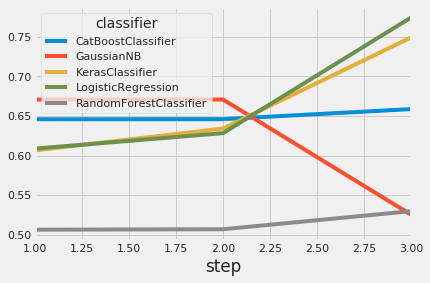

In [62]:
import itertools

steps = [1,2,3] + [1,2,3] + [1,2,3] + [1,2,3] +  [1,2,3] 
classifiers = ["RandomForestClassifier", "LogisticRegression","GaussianNB","CatBoostClassifier","KerasClassifier"]

classifiers = list(itertools.chain.from_iterable(itertools.repeat(x, 3) for x in classifiers))



values = [ 0.506549 ,0.507121,0.529920, #RandomForestClassifier
          0.608911 ,0.628388,0.774191, #LogisticRegression
          0.670789 ,0.670871,0.525620, #GaussianNB
          0.645972,0.646054,0.658729, #CatBoostClassifier
          0.606637,0.634216,0.749112 #KerasClassifier
         ]

classifier_vis_df = pd.DataFrame({'step':steps, 'classifier':classifiers, 'value':values})

# reshape the data to get values by time for each label
classifier_vis_df = classifier_vis_df.pivot(index='step', columns='classifier', values='value')

classifier_vis_df.plot()




### Reflection
Main points of reflection:

* This was a major independent undertanking at personal level in the Data Science world, very distinct experience than the rest of the projects of the course where guidance was readily available on the problem description.

* An important take away of this project is that simpler methods can outperform almost out the box the more advanced and modern techniques, for example : boosting and deep learning.

* Found this project particularly challenging and rewarding at same time given the fact that i had to participate for the first time in a Kaggle competition. 

* During the execution of the project noticed that had to make important tradeoffs of some of the initial ideas on the proposal. For example : the focus on the software tools, deeper investigation of deep learning methods and couple of other approaches that didn't prove to be very relevant to the conclusion of the project.

* One significant learnign for me was on a couple of the algorithms was the ability to use GPU computing environment provided by Goolge Collab.

### Improvements
Possible improvements of this project are the following :
* More advanced feature engineering.
* Using a pipelining that facilitates experiment management similar to Kubeflow or MLFlow.
* Implement a software solution that allow the seamless execution of this pipeline.
* More extensive hyperparameter tuning over the logistic regression classifier.
* Tweak and explore a bit more the Deep Learning approach.
* Experiment with automatic machine learning (example: AutoKeras).

## VI. References




- [1] - Kaggle - (https://www.kaggle.com/c/santander-customer-transaction-prediction)
- [2] - Wikipedia Matthews correlation coefficient - (https://en.wikipedia.org/wiki/Matthews_correlation_coefficient)
- [3] - Steven S. Skiena -  The Data Science Design Manual, Springer, 2014
- [4] - Databricks MLFlow -  https://mlflow.org/, 2019
- [5] - Kubeflow - https://www.kubeflow.org/, 2019
- [6] - Zhang. E. et al - Financial Forecasting and Analysis for Low-Wage Workers - arXiv:1806.05362v3 , 2018
- [7] - Zheng. X et al - FinBrain: When Finance Meets AI 2.0* -Front Inform Technol Electron Eng , 2010 https://arxiv.org/pdf/1808.08497.pdf , 
- [8] - Brownlee J - https://machinelearningmastery.com/tactics-to-combat-imbalanced-classes-in-your-machine-learning-dataset/ - 2019
- [9] - https://www.kaggle.com/jeffd23/10-classifier-showdown-in-scikit-learn , 2018
- [10] Wikipedia Naive Bayes classifier -  https://en.wikipedia.org/wiki/Naive_Bayes_classifier
- [11] Wikipedia Ensemble Learning - https://en.wikipedia.org/wiki/Ensemble_learning
- [12] Wikipedia Random Forest - https://en.wikipedia.org/wiki/Random_forest
- [13] Catboost - https://catboost.ai/
- [14] XGBoost - https://en.wikipedia.org/wiki/XGBoost
- [15] https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
- [16] Imbalanced learn package documentation - https://imbalanced-learn.readthedocs.io